##  **Highway to Hell : A Project on Road Accident Analysis in New York City** 

### **Introduction**
 
 
New York City ranks 4th in the United States for the worst traffic. A 2019 CDC report categorically stated that road accidents were the 3rd leading cause of death in the United States. New York is infamous for its traffic and disproportionately high motor accidents. These statistics propel the need for the analysis of motor accidents in order to mitigate this much-avoidable crisis. 

This prompted us to take up the project of analyzing motor accidents in NYC. Our goal is to understand the story behind this data and observe trends, which will allow us to come up with suggestions that could lead to reductions in the number of fatalities.


We wish to :

1. Decipher if a correlation between the time and frequency of accidents? If yes, then what are the factors leading up to more accidents at a certain time of the day than others. Through this analysis, we wish to understand how the accidents vary over the course of a day, and whether a similar trend is observed throughout the dataset.
 
2. Understand the proportion of accidents that end up injuring the victims based on the time of the day. (Day-partition : morning, afternoon, evening and night). Using this, we get a better idea of the exact percentage of accidents occuring in different day partitions, which builds on the first analysis. 

3. Observe the boroughs over the span of 8 months and analyse if some boroughs of NYC are more accident-prone than their counterparts and what the administration can probably do to decongest the boroughs. We analyze the boroughs and plot the accidents in respective boroughs on a map which allows us to see which ones have the highest number of accidents. 

4.  Discern the leading cause of accidents in the boroughs with most number of accidents (top-3). Could there be a strategy implemented to reduce the occurrence of these accidents? We want to find out the borough that has the highest injuries/fatalities to have some counter-measures in place, like increased response time, more readiness in the health services or more regulation of traffic to prevent accidents in these boroughs.

5. Understanding if certain types of vehicles were more involved in accidents than the others and hypothesizing the results of the analysis with automotive safety. This will allow us to dive deep into the vehicles causing the most accidents and will enable us to make changes based on whether the privately owned cars or the public/commercial cars cause more accidents. 

Through the above questions, we are attempting to make a story which starts off with finding the total accidents occuring throughout the city and giving us an idea of the most accident prone time of the day. Based on this, we attempt to find out the most accident-prone boroughs, and try to correlate this to their population/area and find if the data supports the hypothesis. Once we have the most accident-prone boroughs, we will dive deep into the actual causes of accidents for each of them to try and come up with a solution to mitigate accidents. We also aim to find the exact type of vehicles that are involved so we can take action accordingly based on their type.

### **Dataset Description**

The dataset was obtained through Kaggle named "NYC Traffic Accidents", posted by mysar ahmad bhat. It is a collection of motor vehicle collisions reported by the New York City Police Department. The dataset has around 75,000 rows and 29 columns, and contains information such as the location of accidents, the boroughs, crash date, time, the cause of accidents, the vehicles involved in the accidents and the number of fatalities (injured and killed). The link to the dataset is as follows:
https://www.kaggle.com/mysarahmadbhat/nyc-traffic-accidents

### **Choice for Grading**

From the outset, our group was very excited about the various kinds of visualizations we could do to support our story, which is why we would like the project to be graded heavily on the analysis. We believe that the best way to bring our story to life is through interactive visualizations, which change over time to give an idea of the trend that occurs over months/seasons. 


### **Data Processing**


To begin with, we'll import the necessary libraries.

In [1]:
import numpy as np
import pandas as pd

# Libraries for Visualisation
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries to Process DateTime
import datetime as dt
from dateutil.parser import parse

# Libraries for Text Processing
import re
import spacy
from textblob import TextBlob, Word

import plotly.express as px
import plotly.graph_objects as go

In [2]:
import warnings
warnings.filterwarnings('ignore')

Next, we'll load the 'NYC Accidents 2020.csv' file into a pandas dataframe.

In [3]:
df_accidents = pd.read_csv('NYC Accidents 2020.csv')
df_accidents

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,2020-08-29,15:40:00,BRONX,10466.0,40.892100,-73.833760,POINT (-73.83376 40.8921),PRATT AVENUE,STRANG AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4342908,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
1,2020-08-29,21:00:00,BROOKLYN,11221.0,40.690500,-73.919914,POINT (-73.919914 40.6905),BUSHWICK AVENUE,PALMETTO STREET,NaN,...,Unspecified,NaN,NaN,NaN,4343555,Sedan,Sedan,NaN,NaN,NaN
2,2020-08-29,18:20:00,NaN,NaN,40.816500,-73.946556,POINT (-73.946556 40.8165),8 AVENUE,NaN,NaN,...,NaN,NaN,NaN,NaN,4343142,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN
3,2020-08-29,00:00:00,BRONX,10459.0,40.824720,-73.892960,POINT (-73.89296 40.82472),NaN,NaN,1047 SIMPSON STREET,...,Unspecified,Unspecified,Unspecified,NaN,4343588,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Sedan,Motorcycle,NaN
4,2020-08-29,17:10:00,BROOKLYN,11203.0,40.649890,-73.933890,POINT (-73.93389 40.64989),NaN,NaN,4609 SNYDER AVENUE,...,Unspecified,NaN,NaN,NaN,4342953,Sedan,Sedan,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74876,2020-01-01,15:13:00,BRONX,10459.0,40.826810,-73.896510,POINT (-73.89651 40.82681),NaN,NaN,1122 INTERVALE AVENUE,...,NaN,NaN,NaN,NaN,4268088,Sedan,NaN,NaN,NaN,NaN
74877,2020-01-01,08:00:00,BROOKLYN,11235.0,40.582935,-73.959210,POINT (-73.95921 40.582935),NaN,NaN,3401 GUIDER AVENUE,...,Unspecified,Unspecified,NaN,NaN,4267756,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN
74878,2020-01-01,11:36:00,BRONX,10461.0,40.848553,-73.830055,POINT (-73.830055 40.848553),NaN,NaN,1810 MAHAN AVENUE,...,Unspecified,NaN,NaN,NaN,4269230,Sedan,Pick-up Truck,NaN,NaN,NaN
74879,2020-01-01,01:45:00,MANHATTAN,10017.0,40.753624,-73.969440,POINT (-73.96944 40.753624),EAST 48 STREET,2 AVENUE,NaN,...,Driver Inattention/Distraction,NaN,NaN,NaN,4267482,Sedan,Taxi,NaN,NaN,NaN


#### **Understanding the Dataset**

We'll be performing various tasks below to better understand our dataset and see what cleaning/processing tasks we will need to perform to get the desired result. 

In [4]:
# Checking Number of Rows and Columns
df_accidents.shape

(74881, 29)

In [5]:
# Total Records in the Data
df_accidents.size

2171549

We'll look at descriptive statistics of each column to get an insight of the data.

In [6]:
#Descriptive Statistics of our Data
df_accidents.describe().T

,count,mean,std,min,25%,50%,75%,max
ZIP CODE,49134.0,1.091368e+04,515.069483,1.000000e+04,1.045800e+04,1.121000e+04,1.135400e+04,1.169700e+04
LATITUDE,68935.0,4.068983e+01,1.233368,0.000000e+00,4.066708e+01,4.071688e+01,4.078945e+01,4.091288e+01
LONGITUDE,68935.0,-7.384338e+01,2.234881,-7.425301e+01,-7.395868e+01,-7.391685e+01,-7.386263e+01,0.000000e+00
NUMBER OF PERSONS INJURED,74881.0,3.665549e-01,0.726178,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.500000e+01
NUMBER OF PERSONS KILLED,74881.0,1.923051e-03,0.047609,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
NUMBER OF PEDESTRIANS INJURED,74881.0,5.474019e-02,0.237582,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.000000e+00
NUMBER OF PEDESTRIANS KILLED,74881.0,7.478533e-04,0.027337,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
NUMBER OF CYCLIST INJURED,74881.0,4.370935e-02,0.209737,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00
NUMBER OF CYCLIST KILLED,74881.0,1.201907e-04,0.010963,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
NUMBER OF MOTORIST INJURED,74881.0,2.681054e-01,0.691423,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01


In [7]:
#Checking the Datatypes of the Columns
df_accidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74881 entries, 0 to 74880
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   CRASH DATE                     74881 non-null  object 
 1   CRASH TIME                     74881 non-null  object 
 2   BOROUGH                        49140 non-null  object 
 3   ZIP CODE                       49134 non-null  float64
 4   LATITUDE                       68935 non-null  float64
 5   LONGITUDE                      68935 non-null  float64
 6   LOCATION                       68935 non-null  object 
 7   ON STREET NAME                 55444 non-null  object 
 8   CROSS STREET NAME              35681 non-null  object 
 9   OFF STREET NAME                19437 non-null  object 
 10  NUMBER OF PERSONS INJURED      74881 non-null  int64  
 11  NUMBER OF PERSONS KILLED       74881 non-null  int64  
 12  NUMBER OF PEDESTRIANS INJURED  74881 non-null 

In [8]:
# Number of unique values in each column
df_accidents.nunique()

CRASH DATE                         242
CRASH TIME                        1440
BOROUGH                              5
ZIP CODE                           198
LATITUDE                         29106
LONGITUDE                        23552
LOCATION                         36749
ON STREET NAME                    4009
CROSS STREET NAME                 4405
OFF STREET NAME                  17451
NUMBER OF PERSONS INJURED           12
NUMBER OF PERSONS KILLED             5
NUMBER OF PEDESTRIANS INJURED        6
NUMBER OF PEDESTRIANS KILLED         2
NUMBER OF CYCLIST INJURED            4
NUMBER OF CYCLIST KILLED             2
NUMBER OF MOTORIST INJURED          12
NUMBER OF MOTORIST KILLED            5
CONTRIBUTING FACTOR VEHICLE 1       55
CONTRIBUTING FACTOR VEHICLE 2       45
CONTRIBUTING FACTOR VEHICLE 3       29
CONTRIBUTING FACTOR VEHICLE 4       12
CONTRIBUTING FACTOR VEHICLE 5        6
COLLISION_ID                     74881
VEHICLE TYPE CODE 1                272
VEHICLE TYPE CODE 2      

### Checking for missing Data

Missing Data can often be a very tricky issue to handle for Data Analysts while
looking to provide an analysis on data across various fields. 

In order to appropriately tackle the challenge, arming oneself with relevant 
domain knowledge is is very crucial. 

The following code checks for the percent of Null Values in each column.

In [9]:
# Saving a copy after dropping Null Values
df_accidents2 = df_accidents.copy(deep = True)
df_accidents2.rename(str.title, axis='columns',inplace = True)
df_accidents2 = df_accidents2.dropna(subset = ['Borough'])

# Percentage of Null Values in each Column
round(df_accidents.isnull().sum()/len(df_accidents)*100,3)

CRASH DATE                        0.000
CRASH TIME                        0.000
BOROUGH                          34.376
ZIP CODE                         34.384
LATITUDE                          7.941
LONGITUDE                         7.941
LOCATION                          7.941
ON STREET NAME                   25.957
CROSS STREET NAME                52.350
OFF STREET NAME                  74.043
NUMBER OF PERSONS INJURED         0.000
NUMBER OF PERSONS KILLED          0.000
NUMBER OF PEDESTRIANS INJURED     0.000
NUMBER OF PEDESTRIANS KILLED      0.000
NUMBER OF CYCLIST INJURED         0.000
NUMBER OF CYCLIST KILLED          0.000
NUMBER OF MOTORIST INJURED        0.000
NUMBER OF MOTORIST KILLED         0.000
CONTRIBUTING FACTOR VEHICLE 1     0.406
CONTRIBUTING FACTOR VEHICLE 2    20.828
CONTRIBUTING FACTOR VEHICLE 3    90.966
CONTRIBUTING FACTOR VEHICLE 4    97.528
CONTRIBUTING FACTOR VEHICLE 5    99.302
COLLISION_ID                      0.000
VEHICLE TYPE CODE 1               0.848


### Imputing Missing Values

Filling Null values on a large dataset can be computationally demanding.
Here, we attempt to fill the missing data in the form of Null values only in
the `Borough` column in order to do a more comprehensive Data analysis. We
notice that the missing data in this column is accompanied by valid `Latitude`
and `Longitude` observations, which can act as accurate cues to other data points with similar or identical GPS Locations, and fill the Borough with the closest such Borough.

We attempt to use the `verstack` package, which can be used to fill numeric,
categorical and text data.<br>It is a much simpler alternative to machine learning models like XGBoost, especially on a large dataset.<br>
It has a MIT License and is free to use.



In [10]:
#Installing the package
!pip install verstack

In [11]:
from verstack import NaNImputer

# We use only the 3 Most Important columns that act as Predictors of the Borough to fill Null values to simplify the process
imputer = NaNImputer(n_feats = 3, feature_selection = 'feature_importance', nan_cols = ['BOROUGH'])
df_without_nans = imputer.impute(df_accidents)

NaNImputer(conservative = False, n_feats = 3,            
           fix_string_nans = True, verbose = True,                
           multiprocessing_load = 3, fill_nans_in_pure_text = True,                    
           drop_empty_cols = True, drop_nan_cols_with_constant = True                        
           feature_selection = feature_importance)

Dataset dimensions:
 - rows:         74881
 - columns:      29
 - mb in memory: 16.57
 - NaN cols num: 18
--------------------------

Deploy multiprocessing with 8 parallel proceses


NaNs imputation time: 1.42 minutes
--------------------------------------------------


In [12]:
#Checking for null values in Borough
round(df_accidents['BOROUGH'].isnull().sum()/len(df_accidents)*100,3)

0.0

### Data Transformation and Processing

*   Converting Crash Date and Crash Time to one column of Crash DateTime to represent the crash time as one column
*   Dropping Crash Date, Crash Time and Location columns as they are redundant data and same data is present in other columns.
*   Converting column names to Title from Upper case.
*   Converting Crash Datetime value from str to datetime type to make it into appropriate datatype and for further analysis. 



In [13]:
# We are merging CRASH DATE and CRASH TIME columns into one column, namely CRASH DATETIME. 
date_time = df_accidents['CRASH DATE'] + ' ' + df_accidents['CRASH TIME']
date_time.map(lambda t: parse(t))
df_accidents['CRASH DATETIME'] = date_time
df_accidents

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,CRASH DATETIME
0,2020-08-29,15:40:00,BRONX,10466.0,40.892100,-73.833760,POINT (-73.83376 40.8921),PRATT AVENUE,STRANG AVENUE,NaN,...,NaN,NaN,NaN,4342908,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,2020-08-29 15:40:00
1,2020-08-29,21:00:00,BROOKLYN,11221.0,40.690500,-73.919914,POINT (-73.919914 40.6905),BUSHWICK AVENUE,PALMETTO STREET,NaN,...,NaN,NaN,NaN,4343555,Sedan,Sedan,NaN,NaN,NaN,2020-08-29 21:00:00
2,2020-08-29,18:20:00,QUEENS,NaN,40.816500,-73.946556,POINT (-73.946556 40.8165),8 AVENUE,NaN,NaN,...,NaN,NaN,NaN,4343142,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN,2020-08-29 18:20:00
3,2020-08-29,00:00:00,BRONX,10459.0,40.824720,-73.892960,POINT (-73.89296 40.82472),NaN,NaN,1047 SIMPSON STREET,...,Unspecified,Unspecified,NaN,4343588,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Sedan,Motorcycle,NaN,2020-08-29 00:00:00
4,2020-08-29,17:10:00,BROOKLYN,11203.0,40.649890,-73.933890,POINT (-73.93389 40.64989),NaN,NaN,4609 SNYDER AVENUE,...,NaN,NaN,NaN,4342953,Sedan,Sedan,NaN,NaN,NaN,2020-08-29 17:10:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74876,2020-01-01,15:13:00,BRONX,10459.0,40.826810,-73.896510,POINT (-73.89651 40.82681),NaN,NaN,1122 INTERVALE AVENUE,...,NaN,NaN,NaN,4268088,Sedan,NaN,NaN,NaN,NaN,2020-01-01 15:13:00
74877,2020-01-01,08:00:00,BROOKLYN,11235.0,40.582935,-73.959210,POINT (-73.95921 40.582935),NaN,NaN,3401 GUIDER AVENUE,...,Unspecified,NaN,NaN,4267756,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,2020-01-01 08:00:00
74878,2020-01-01,11:36:00,BRONX,10461.0,40.848553,-73.830055,POINT (-73.830055 40.848553),NaN,NaN,1810 MAHAN AVENUE,...,NaN,NaN,NaN,4269230,Sedan,Pick-up Truck,NaN,NaN,NaN,2020-01-01 11:36:00
74879,2020-01-01,01:45:00,MANHATTAN,10017.0,40.753624,-73.969440,POINT (-73.96944 40.753624),EAST 48 STREET,2 AVENUE,NaN,...,NaN,NaN,NaN,4267482,Sedan,Taxi,NaN,NaN,NaN,2020-01-01 01:45:00


In [14]:
#As CRASH DATETIME column contains string values, here we are converting them to datetime values.
df_accidents['CRASH DATETIME'] = df_accidents['CRASH DATETIME'].map(lambda t: dt.datetime.strptime(t, '%Y-%m-%d %H:%M:%S'))

In [15]:
#Next, we are making CRASH DATETIME as the first column
first_column = df_accidents.pop('CRASH DATETIME')
df_accidents.insert(0, 'CRASH DATETIME', first_column)

In [16]:
#Since we have CRASH DATETIME column, we can get rid of CRASH DATE and CRASH TIME columns. Also, we can remove location column as it is derived from Latitude and Longitude columns.
df_accidents.drop(columns=['CRASH DATE','LOCATION'],inplace=True)

In [17]:
#Changing column name to Title format from Upper case
df_accidents.rename(str.title, axis='columns',inplace = True)

In [18]:
df_accidents


,Crash Datetime,Crash Time,Borough,Zip Code,Latitude,Longitude,On Street Name,Cross Street Name,Off Street Name,Number Of Persons Injured,...,Contributing Factor Vehicle 2,Contributing Factor Vehicle 3,Contributing Factor Vehicle 4,Contributing Factor Vehicle 5,Collision_Id,Vehicle Type Code 1,Vehicle Type Code 2,Vehicle Type Code 3,Vehicle Type Code 4,Vehicle Type Code 5
0,2020-08-29 15:40:00,15:40:00,BRONX,10466.0,40.892100,-73.833760,PRATT AVENUE,STRANG AVENUE,NaN,0,...,Unspecified,NaN,NaN,NaN,4342908,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
1,2020-08-29 21:00:00,21:00:00,BROOKLYN,11221.0,40.690500,-73.919914,BUSHWICK AVENUE,PALMETTO STREET,NaN,2,...,Unspecified,NaN,NaN,NaN,4343555,Sedan,Sedan,NaN,NaN,NaN
2,2020-08-29 18:20:00,18:20:00,QUEENS,NaN,40.816500,-73.946556,8 AVENUE,NaN,NaN,1,...,NaN,NaN,NaN,NaN,4343142,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN
3,2020-08-29 00:00:00,00:00:00,BRONX,10459.0,40.824720,-73.892960,NaN,NaN,1047 SIMPSON STREET,0,...,Unspecified,Unspecified,Unspecified,NaN,4343588,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Sedan,Motorcycle,NaN
4,2020-08-29 17:10:00,17:10:00,BROOKLYN,11203.0,40.649890,-73.933890,NaN,NaN,4609 SNYDER AVENUE,0,...,Unspecified,NaN,NaN,NaN,4342953,Sedan,Sedan,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74876,2020-01-01 15:13:00,15:13:00,BRONX,10459.0,40.826810,-73.896510,NaN,NaN,1122 INTERVALE AVENUE,0,...,NaN,NaN,NaN,NaN,4268088,Sedan,NaN,NaN,NaN,NaN
74877,2020-01-01 08:00:00,08:00:00,BROOKLYN,11235.0,40.582935,-73.959210,NaN,NaN,3401 GUIDER AVENUE,0,...,Unspecified,Unspecified,NaN,NaN,4267756,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN
74878,2020-01-01 11:36:00,11:36:00,BRONX,10461.0,40.848553,-73.830055,NaN,NaN,1810 MAHAN AVENUE,0,...,Unspecified,NaN,NaN,NaN,4269230,Sedan,Pick-up Truck,NaN,NaN,NaN
74879,2020-01-01 01:45:00,01:45:00,MANHATTAN,10017.0,40.753624,-73.969440,EAST 48 STREET,2 AVENUE,NaN,0,...,Driver Inattention/Distraction,NaN,NaN,NaN,4267482,Sedan,Taxi,NaN,NaN,NaN


In [19]:
df_accidents = df_accidents.assign(session=pd.cut(df_accidents['Crash Datetime'].dt.hour,[0,6,12,17,23],labels=['Night','Morning','Afternoon','Evening'],include_lowest=True))

In [20]:
df_accidents

,Crash Datetime,Crash Time,Borough,Zip Code,Latitude,Longitude,On Street Name,Cross Street Name,Off Street Name,Number Of Persons Injured,...,Contributing Factor Vehicle 3,Contributing Factor Vehicle 4,Contributing Factor Vehicle 5,Collision_Id,Vehicle Type Code 1,Vehicle Type Code 2,Vehicle Type Code 3,Vehicle Type Code 4,Vehicle Type Code 5,session
0,2020-08-29 15:40:00,15:40:00,BRONX,10466.0,40.892100,-73.833760,PRATT AVENUE,STRANG AVENUE,NaN,0,...,NaN,NaN,NaN,4342908,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,Afternoon
1,2020-08-29 21:00:00,21:00:00,BROOKLYN,11221.0,40.690500,-73.919914,BUSHWICK AVENUE,PALMETTO STREET,NaN,2,...,NaN,NaN,NaN,4343555,Sedan,Sedan,NaN,NaN,NaN,Evening
2,2020-08-29 18:20:00,18:20:00,QUEENS,NaN,40.816500,-73.946556,8 AVENUE,NaN,NaN,1,...,NaN,NaN,NaN,4343142,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN,Evening
3,2020-08-29 00:00:00,00:00:00,BRONX,10459.0,40.824720,-73.892960,NaN,NaN,1047 SIMPSON STREET,0,...,Unspecified,Unspecified,NaN,4343588,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Sedan,Motorcycle,NaN,Night
4,2020-08-29 17:10:00,17:10:00,BROOKLYN,11203.0,40.649890,-73.933890,NaN,NaN,4609 SNYDER AVENUE,0,...,NaN,NaN,NaN,4342953,Sedan,Sedan,NaN,NaN,NaN,Afternoon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74876,2020-01-01 15:13:00,15:13:00,BRONX,10459.0,40.826810,-73.896510,NaN,NaN,1122 INTERVALE AVENUE,0,...,NaN,NaN,NaN,4268088,Sedan,NaN,NaN,NaN,NaN,Afternoon
74877,2020-01-01 08:00:00,08:00:00,BROOKLYN,11235.0,40.582935,-73.959210,NaN,NaN,3401 GUIDER AVENUE,0,...,Unspecified,NaN,NaN,4267756,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,Morning
74878,2020-01-01 11:36:00,11:36:00,BRONX,10461.0,40.848553,-73.830055,NaN,NaN,1810 MAHAN AVENUE,0,...,NaN,NaN,NaN,4269230,Sedan,Pick-up Truck,NaN,NaN,NaN,Morning
74879,2020-01-01 01:45:00,01:45:00,MANHATTAN,10017.0,40.753624,-73.969440,EAST 48 STREET,2 AVENUE,NaN,0,...,NaN,NaN,NaN,4267482,Sedan,Taxi,NaN,NaN,NaN,Night


## Data Analysis 

Interactive Visualizations, Analyses and, Inferences  





### Analysis 1: Correlation between the Time and Frequency of Accidents 



One of the primary focuses of our team was to understand the correlation between the time of the day and the frequency of accidents. This was to decipher if Mayor Bill de Blasio's goal, "Vission Zero," an ambitious plan to minimize the traffic accidents on the streets of New York and quash motor accident fatalities, was on track.


While it is common knowledge that the rush hours (and even late-night hours) primarily see an uptick in motor accidents as opposed to other times of the day, the team wanted to understand if the trend held true even during the pandemic time as the data used for this analysis covered the time spectrum when New York was under a spate of lockdowns followed by the partial resumption of economical activities.

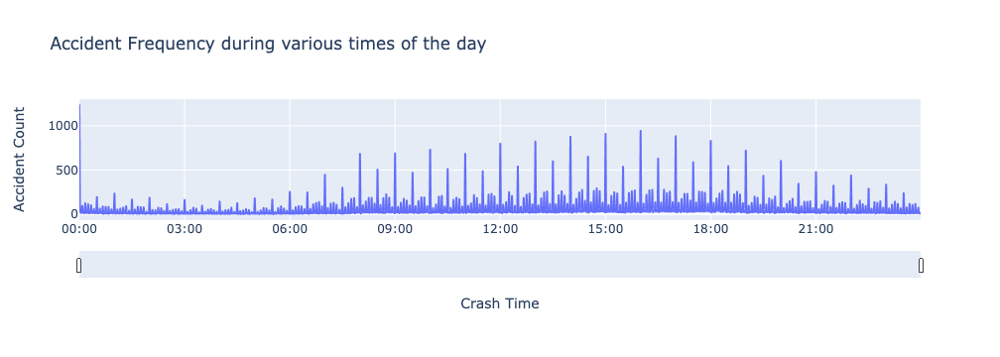

In [21]:
# Plotting Time of the Day vs Accident Frequency
import plotly.express as px
df_timedaccidents = df_accidents[['Crash Time','Collision_Id']].groupby(by='Crash Time').count()
df_timedaccidents.reset_index(inplace=True)
df_timedaccidents['Crash Time'] =pd.to_datetime( df_timedaccidents['Crash Time'])
df_timedaccidents = df_timedaccidents.rename(columns={'Collision_Id':'Accident Count'})
fig = px.line(df_timedaccidents, 'Crash Time', 'Accident Count',title="Accident Frequency during various times of the day")
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(xaxis=dict(tickformat="%H:%M"))
fig.show()

### Insights:

The insights drawn from this analysis were indeed fascinating. The relation between the time of the day and the accidents held true even during the pandemic. One of the probable reasons for that can be attributed to this is the correlation doesn't imply causation.  The reduction in traffic on-road owing to curbs didn't translate to a lesser number of accidents. On further research, we did find out that our hypothesis was accurate. According to a New York Times article (which substantiated our hypothesis), a large number of people ended up indulging in reckless driving and drag races as a mode of entertainment and as a liberating medium.


### Analysis 2 :  Understanding the Correlation between the Time Periods across the Day and the Frequency of the Accidents 
    
Building upon the first analysis, our team further wished to probe the number of people injured in these road accidents based on dayparting (i.e., morning, afternoon, evening, or night). Not all accidents result in injuries or casualties. There was a need to examine whether the injury trend fell in line with the accident trend. This is necessary to help the medical system better equip and handle injured patients. (if accidents occur more in the mornings, ER rooms can reallot the shifts to ensure more orthopedic surgeons and doctors serve in the morning.)

In [22]:
#Create a dataframe counting the total number of people injured & killed
df1=pd.pivot_table(df_accidents, index=['session'],values=['Number Of Persons Injured','Number Of Persons Killed'],aggfunc=np.sum)
#Create a dataframe counting the number of accidents in each day session
df2=pd.pivot_table(df_accidents, index=['session'], values='Zip Code',aggfunc=len)
df2=df2.rename(columns={'Zip Code':'Count'})
#Concatinating the two dataframes for final data
final = pd.concat([df1,df2],axis=1).reset_index()


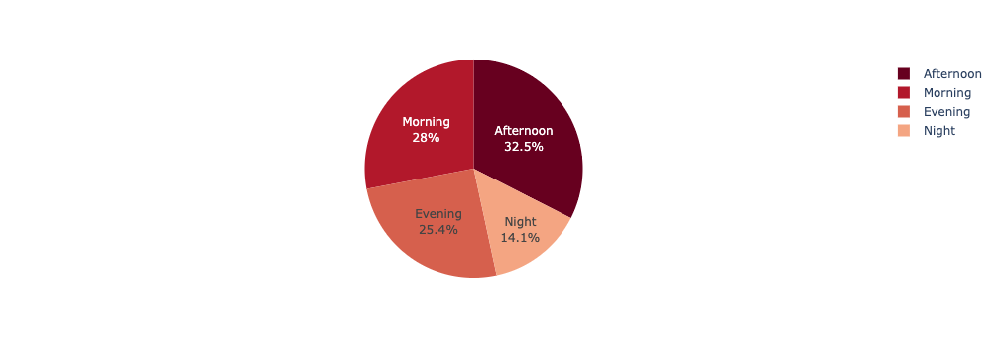

In [23]:
fig = px.pie(final, values = 'Count' , names = 'session' , color_discrete_sequence=px.colors.sequential.RdBu,hover_data=['Number Of Persons Injured'])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


### Insights:

The results indeed stand witness to the fact that empty roads can be more dangerous for drivers and pedestrians than the rush hours, where the drivers are more cognizant about the motor rules when around fellow drivers. The night-time anomaly (less traffic: more danger not upheld) exists since New York was under night-curfews (alongside lockdown), which meant that bars/restaurants could not serve people beyond certain hours of the night. So, it cut down the incentives for the people to drive outside their house and indulge in recreational activities (drunken driving at night). Thus, nights during the pandemic ended up being less injury-causing in retrospect with the time before the pandemic struck.

### Analysis 3 :  Understanding which Boroughs were more prone to Accidents and Seasonality of Accidents in these Boroughs based on Months 

Previous analyses dealt with daily trends and were generic to the entire state of New York. The team, after a series of discussions, decided to analyze which boroughs were more susceptible to accidents. (as opposed to other boroughs in New York.)This is necessary for the city administration to better implement decongestion strategies like congestion pricing borough-wise.




In [24]:
df_accidents['Total Injured'] = df_accidents['Number Of Persons Injured']+df_accidents['Number Of Pedestrians Injured']+df_accidents['Number Of Cyclist Injured']+df_accidents[ 'Number Of Motorist Injured']
df_accidents['Total Deaths'] = df_accidents['Number Of Persons Killed']+df_accidents['Number Of Pedestrians Killed']+df_accidents['Number Of Cyclist Killed']+df_accidents[ 'Number Of Motorist Killed']
df_accidents['Total Victims'] =df_accidents['Total Deaths']+df_accidents['Total Injured']
df_accidents.shape

(74881, 32)

In [25]:
# Saving a copy after Dropping Null Values
df_accidents2['Crash Datetime'] = date_time
df_accidents2['Crash Datetime'] = df_accidents2['Crash Datetime'].map(lambda t: dt.datetime.strptime(t, '%Y-%m-%d %H:%M:%S'))

df_accidents2['Total Injured'] = df_accidents2['Number Of Persons Injured']+df_accidents2['Number Of Pedestrians Injured']+df_accidents2['Number Of Cyclist Injured']+df_accidents2[ 'Number Of Motorist Injured']
df_accidents2['Total Deaths'] = df_accidents2['Number Of Persons Killed']+df_accidents2['Number Of Pedestrians Killed']+df_accidents2['Number Of Cyclist Killed']+df_accidents2[ 'Number Of Motorist Killed']
df_accidents2['Total Victims'] =df_accidents2['Total Deaths']+df_accidents2['Total Injured']
df_accidents2

,Crash Date,Crash Time,Borough,Zip Code,Latitude,Longitude,Location,On Street Name,Cross Street Name,Off Street Name,...,Collision_Id,Vehicle Type Code 1,Vehicle Type Code 2,Vehicle Type Code 3,Vehicle Type Code 4,Vehicle Type Code 5,Crash Datetime,Total Injured,Total Deaths,Total Victims
0,2020-08-29,15:40:00,BRONX,10466.0,40.892100,-73.833760,POINT (-73.83376 40.8921),PRATT AVENUE,STRANG AVENUE,NaN,...,4342908,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,2020-08-29 15:40:00,0,0,0
1,2020-08-29,21:00:00,BROOKLYN,11221.0,40.690500,-73.919914,POINT (-73.919914 40.6905),BUSHWICK AVENUE,PALMETTO STREET,NaN,...,4343555,Sedan,Sedan,NaN,NaN,NaN,2020-08-29 21:00:00,4,0,4
3,2020-08-29,00:00:00,BRONX,10459.0,40.824720,-73.892960,POINT (-73.89296 40.82472),NaN,NaN,1047 SIMPSON STREET,...,4343588,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Sedan,Motorcycle,NaN,2020-08-29 00:00:00,0,0,0
4,2020-08-29,17:10:00,BROOKLYN,11203.0,40.649890,-73.933890,POINT (-73.93389 40.64989),NaN,NaN,4609 SNYDER AVENUE,...,4342953,Sedan,Sedan,NaN,NaN,NaN,2020-08-29 17:10:00,0,0,0
6,2020-08-29,19:30:00,BRONX,10459.0,40.825226,-73.887780,POINT (-73.88778 40.825226),LONGFELLOW AVENUE,EAST 165 STREET,NaN,...,4343004,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN,2020-08-29 19:30:00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74876,2020-01-01,15:13:00,BRONX,10459.0,40.826810,-73.896510,POINT (-73.89651 40.82681),NaN,NaN,1122 INTERVALE AVENUE,...,4268088,Sedan,NaN,NaN,NaN,NaN,2020-01-01 15:13:00,0,0,0
74877,2020-01-01,08:00:00,BROOKLYN,11235.0,40.582935,-73.959210,POINT (-73.95921 40.582935),NaN,NaN,3401 GUIDER AVENUE,...,4267756,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,2020-01-01 08:00:00,0,0,0
74878,2020-01-01,11:36:00,BRONX,10461.0,40.848553,-73.830055,POINT (-73.830055 40.848553),NaN,NaN,1810 MAHAN AVENUE,...,4269230,Sedan,Pick-up Truck,NaN,NaN,NaN,2020-01-01 11:36:00,0,0,0
74879,2020-01-01,01:45:00,MANHATTAN,10017.0,40.753624,-73.969440,POINT (-73.96944 40.753624),EAST 48 STREET,2 AVENUE,NaN,...,4267482,Sedan,Taxi,NaN,NaN,NaN,2020-01-01 01:45:00,0,0,0


In [26]:
import plotly.graph_objects as go

# Creating a Month column to use as a slider
df_accidents2['Month'] = df_accidents2['Crash Datetime'].dt.month
# sorting the data based on the Month column
df_accidents2.sort_values('Month', ascending=True, ignore_index=True, inplace=True)

fig = px.scatter_mapbox(df_accidents2, lat='Latitude', lon='Longitude',  color = 'Borough', color_discrete_sequence = ['blue','purple','yellow','red','orange'], hover_name = 'Borough', hover_data = ['Total Injured','Total Deaths'], animation_frame="Month", mapbox_style="stamen-terrain")
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=-74)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Insights:

The visualization shows the timelapse of the accidents over eight months ( From January 2020 to August 2020) in different boroughs of New York, reaffirming that the roads in Bronx, Queens, and Brooklyn are too congested, increasing the risk of mishaps. 
One of the reasons attributed to this is the fact that the commuters travel from these boroughs to places like Manhattan for their jobs.
Decongestion measures have been proposed by the civic body to reduce the traffic on the roads. One of the possible solutions that can be implemented apart from the congestion tax is the odd-even scheme, and the vehicles possessing license plates ending with odd numbers and even number travel on alternate days.

### Analysis 4:  Understanding the Biggest Contributing Factors of Accidents for Vehicles and the Number of Injuries for each factor

We wish to go in-depth in our data to find the most common contributing factors for accidents across various boroughs to try and get an idea of what issues are most pertinent. We want to know whether the factors causing the accidents are same across all the different boroughs and if there is any factor which stands out. We are also finding the number of injuries for each of these factors to elucidate the importance of eradicating these factors, as they would reduce the number of injuries cause by accidents every year. Based on our findings, we could come up with a solution to mitigate these factors, resulting in a reduction of accidents by educating the public of New York City.

In [27]:
test1 = df_accidents.groupby(by=['Borough','Contributing Factor Vehicle 1','Contributing Factor Vehicle 2','Contributing Factor Vehicle 3','Contributing Factor Vehicle 4','Contributing Factor Vehicle 5']).sum()[['Total Victims']]
test1 = test1.reset_index()
test2 = test1[test1['Contributing Factor Vehicle 2']!='Unspecified'].reset_index()   
test2 = test2[test2['Borough']!='MANHATTAN']
test2 = test2[test2['Borough']!='STATEN ISLAND']

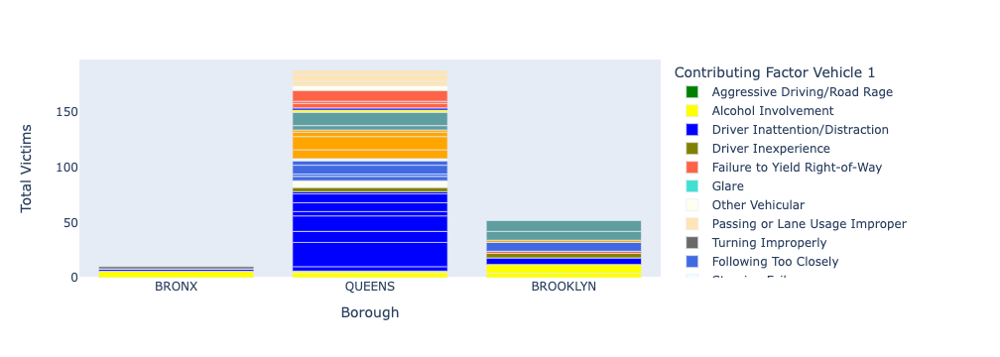

In [28]:
colors = px.colors.qualitative.T10

fig = px.bar(test2, 
             x = 'Borough',
             y = 'Total Victims',
             color='Contributing Factor Vehicle 1',
             color_discrete_sequence =['green','yellow','blue','olive','tomato','turquoise','ivory','moccasin','dimgrey','royalblue','azure','orange','cadetblue']
             )
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

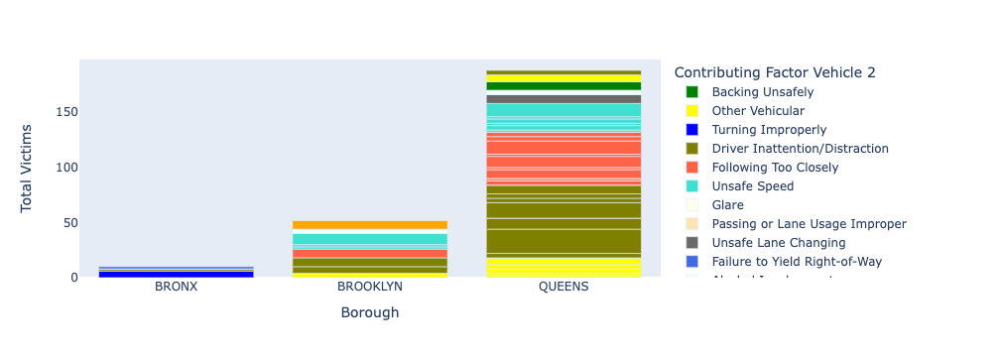

In [29]:
colors = px.colors.qualitative.T10

fig = px.bar(test2, 
             x = 'Borough',
             y = 'Total Victims',
             color='Contributing Factor Vehicle 2',
             color_discrete_sequence =['green','yellow','blue','olive','tomato','turquoise','ivory','moccasin','dimgrey','royalblue','azure','orange','cadetblue']
             )
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

### Insights:

On analyzing the contributing factors of accidents for vehicles in different boroughs, we realize that the number of injuries occuring in Queens is more than the sum of the next 4 boroughs combined. This suggests that if you were injured in a car accident in New York, there is a 63.5% chance that it occured in Queens. This is damning evidence as Queens is not even the most populous borough in New York. Brooklyn has the highest population in NYC and accounts for almost 32% of the entire population of the city. Despite being the most populated borough, Brooklyn contributes to only 20% of the injuries in NYC. However, Queens has the most area amongst any borough in New York, but the number of accidents and injuries occuring there points to a lack of safety measures and recklessness amongst the citizens of the borough.

The biggest contributing factor of accidents in Queens is "Driver Inattention/Distraction" about 24%, closely followed by "Unsafe Speeds" about 21%. Both of them put together account to a total of 45% of accidents occuring in the Queens borough. For Brooklyn, we observe that "Unsafe Speeds" is a big contributing factor followed by "Driver Inattention/Distraction." Thus, we can conclude that these factors are big reasons in the occurence of accidents in New York City, and must be eradicated in order to make the city safer. Accidents due to alcohol involvement are low across all boroughs, and it is supported by our analysis where we found the accidents occuring in the night time to be the lowest across the day. 

Some ways in which we could reduce the accidents occuring in these boroughs is by implementing stricter penalties on speeding, including more stop signs and speed-breakers on the roads/locations where a lot of these accidents occur and by properly enforcing the traffic rules which will prevent injuries due to overspeeding. Another thing that can be done is to band the use of phones/technology while driving, reducing the distractions to the drivers. Some states have laws in place which ban the use of mobile phones while driving, which could help reduce injuries due to distraction. Finally, conducting education workshops might educate people and urge them to do better in trying to avoid accidents on road.

### Analysis 5 :  Understanding the type of vehicles involved and the number of injuries for each vehicle

Now that we know at what time of day the most accidents occur, which boroughs are most prone to accidents and what the biggest contributing factors are, we wish to know the types of vehicles that are involved in the most number of accidents in the boroughs. This analysis will help us get a better idea of which vehicles are causing trouble, and will provide the backing required to regulate these types of vehicles to prevent further accidents. 


In [30]:
# Creating an array of unique vehicle types
vehicle_type_array = np.unique(np.concatenate((df_accidents['Vehicle Type Code 1'].unique(),df_accidents['Vehicle Type Code 2'].unique(),
                          df_accidents['Vehicle Type Code 3'].unique(),df_accidents['Vehicle Type Code 4'].unique(),
                          df_accidents['Vehicle Type Code 5'].unique())).astype(str))

In [31]:
# Creating an array of borough names
borough_array = np.unique(df_accidents['Borough'].astype(str))

In [32]:
# Creating a dataframe that shows the number of accidents across boroughs and vehicle types
# The cells will be filled with values in the next code block
df_vehicle_borough_array = pd.DataFrame(index=vehicle_type_array, columns=borough_array, data=np.nan)

In [33]:
# Filling the cells in df_vehicle_borough_array by supplying the borough name and vehicle type to df_accidents and obtaining the frequency.
for c in df_vehicle_borough_array.columns:
    for r in df_vehicle_borough_array.index:
        df_vehicle_borough_array.loc[r,c] = df_accidents.loc[((df_accidents['Vehicle Type Code 1'] == r) | (df_accidents['Vehicle Type Code 2'] == r) | 
                (df_accidents['Vehicle Type Code 3'] == r) | (df_accidents['Vehicle Type Code 4'] == r) |
                (df_accidents['Vehicle Type Code 5'] == r)) & (df_accidents['Borough'] == c),:].index.size

In [34]:
# Adding a new column, TOTAL to df_vehicle_borough_array that displays the total number of accidents across the 5 boroughs for each vehicle type 
df_vehicle_borough_array['TOTAL'] = df_vehicle_borough_array['BRONX'] + df_vehicle_borough_array['BROOKLYN'] + df_vehicle_borough_array['MANHATTAN'] + df_vehicle_borough_array['QUEENS'] + df_vehicle_borough_array['STATEN ISLAND']

In [35]:
#Sorting the dataframe by descending order of TOTAL column
df_vehicle_borough_array.sort_values(by='TOTAL', ascending=False, inplace=True)

In [36]:
# We delete the TOTAL column
del df_vehicle_borough_array['TOTAL']

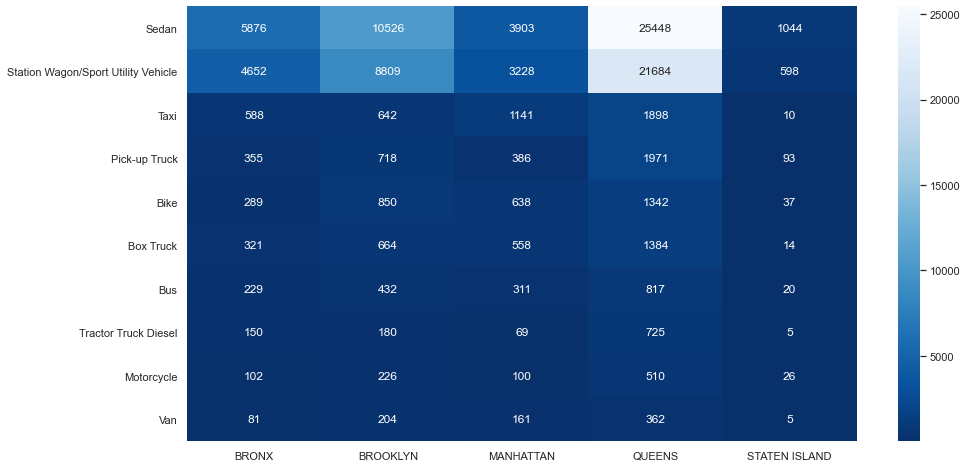

In [37]:
# We display the dataframe results in a heatmap. We only display the top 10 rows of the dataframe in the heatmap.
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df_vehicle_borough_array.head(10).astype(int), annot=True, fmt='d', cmap="Blues_r")

#### Insights

On analyzing the number of accidents, we can see that sedans and SUV's are involved in the most number of accidents across all the boroughs. These are typically privately owned vehicles, indicating that the majority of accidents occur in personal owned vehicles rather than commercially owned vehicles. As we saw in the previous analysis, Queens had the highest number of accidents and the majority of these accidents come from sedans and SUV's.

This could also boil down to the safety measures implemented in these vehicles. The vehicles could be involved in accidents due to many reasons as we saw in the previous analysis, however the safety measures in these vehicles, especially the sedans and SUV's come under question. There have been reports of many SUV's rolling-over on contact, causing harm to the passengers inside. Thus, some ways to mitigate injuries due to accidents in these types of vehicles could be to ensure proper safety measures and checks are done on these vehicles at the time of production. Secondly, since the vehicles causing the most number of accidents are private vehicles, we will need to implement stricter traffic laws and regulate these vehicles. Also, there needs to be proper training of drivers and heavier penalties in case of accidents which would ensure other people follow the rules.

### Conclusion

Through out analyses, we created a story that started right from the total number of accidents occuring in New York City and the time at which they occured, down to the reasons for them and the vehicles causing it. We looked at what time of the day was most prone to accidents and found out that majority of the accidents occured during the afternoon, which is still a relatively busier time with a lot of traffic density on the roads. Then we analyzed the boroughs to find which ones have the maximum number of accidents and the trend over 8 months. 

Our analysis showed that Queens has the most accidents and injuries amongst all the other boroughs despite not being the densely populated one. This was a little unexpected however, this could also be due to the fact that a Queens is a tourist friendly place and there is a huge density of traffic there throughout the day.

Once we found the top 3 boroughs in terms of accidents, we wished to understand the reasons for these accidents. Our analysis showed that across all boroughs, the top reason for accidents was "Driver Inattention/Distraction" and "Unsafe Speeds." Based on our findings we attempted to provide solutions such as education sessions and stricter law enforcement which could mitigate these reasons to an extent and bringing the number of accidents down. Finally, we analyzed the types of vehicles involved in accidents and found that privately owned sedans and SUV's were the major contributing factor in accidents and resulted in a lot of injuries. 

Through our analyses, we have conducted an in-depth inspection of traffic accidents in New York City and found pertinent information which could be useful to people planning to visit the city or living there, and enabling them to be careful by arming them with knowledge of accidents occuring. We believe we have provided valid suggestions for improvement, and hope that it makes a difference by reducing the number of accidents in the subsequent years. 